# ReneWind

Renewable energy sources play an increasingly important role in the global energy mix, as the effort to reduce the environmental impact of energy production increases.

Out of all the renewable energy alternatives, wind energy is one of the most developed technologies worldwide. The U.S Department of Energy has put together a guide to achieving operational efficiency using predictive maintenance practices.

Predictive maintenance uses sensor information and analysis methods to measure and predict degradation and future component capability. The idea behind predictive maintenance is that failure patterns are predictable and if component failure can be predicted accurately and the component is replaced before it fails, the costs of operation and maintenance will be much lower.

The sensors fitted across different machines involved in the process of energy generation collect data related to various environmental factors (temperature, humidity, wind speed, etc.) and additional features related to various parts of the wind turbine (gearbox, tower, blades, break, etc.). 



## Objective
“ReneWind” is a company working on improving the machinery/processes involved in the production of wind energy using machine learning and has collected data of generator failure of wind turbines using sensors. They have shared a ciphered version of the data, as the data collected through sensors is confidential (the type of data collected varies with companies). Data has 40 predictors, 40000 observations in the training set and 10000 in the test set.

The objective is to build various classification models, tune them and find the best one that will help identify failures so that the generator could be repaired before failing/breaking and the overall maintenance cost of the generators can be brought down. 

“1” in the target variables should be considered as “failure” and “0” will represent “No failure”.

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a wind turbine where there is no detection by model. 
- False positives (FP) are detections in a wind turbine where there is no failure. 

So, the maintenance cost associated with the model would be:

**Maintenance cost** = `TP*(Repair cost) + FN*(Replacement cost) + FP*(Inspection cost)`
where,

- `Replacement cost = $40,000`
- `Repair cost = $15,000`
- `Inspection cost = $5,000`

Here the objective is to reduce the maintenance cost so, we want a metric that could reduce the maintenance cost.

- The minimum possible maintenance cost  =  `Actual failures*(Repair cost) = (TP + FN)*(Repair cost)`
- The maintenance cost associated with model = `TP*(Repair cost) + FN*(Replacement cost) + FP*(Inspection cost)`

So, we will try to maximize the ratio of minimum possible maintenance cost and the maintenance cost associated with the model.

The value of this ratio will lie between 0 and 1, the ratio will be 1 only when the maintenance cost associated with the model will be equal to the minimum possible maintenance cost.

## Data Description
- The data provided is a transformed version of original data which was collected using sensors.
- Train.csv - To be used for training and tuning of models. 
- Test.csv - To be used only for testing the performance of the final best model.
- Both the datasets consist of 40 predictor variables and 1 target variable

## Importing libraries

In [6]:
# !pip install nb-black

In [8]:
# !pip install imblearn

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,  # Updated import
)
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import scipy.stats as stats
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import warnings

# Set options
pd.set_option("display.max_columns", None)
pd.set_option("display.float_format", lambda x: "%.3f" % x)
warnings.filterwarnings("ignore")

# Example usage: Loading data, training a model, and displaying a confusion matrix

# Load your dataset
# df = pd.read_csv('your_data.csv')  # Replace with your actual data file

# Example data preparation (replace with actual preprocessing steps)
# X = df.drop('target', axis=1)  # Replace 'target' with your actual target column
# y = df['target']

# Example train-test split
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Example model training (Logistic Regression)
# model = LogisticRegression()
# model.fit(X_train, y_train)

# Example predictions
# y_pred = model.predict(X_test)

# Plot confusion matrix
# ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)
# plt.show()

# Note: Replace commented sections with actual data processing and model code as needed


load data set

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np

# Loading the dataset with the correct path
train = pd.read_csv(r"C:\Users\Digital\Desktop\mj\Train.csv")

# Display all rows in the dataset
pd.set_option("display.max_rows", None)  # Removes the limit on the number of rows displayed
print(train)


           V1      V2      V3      V4     V5      V6     V7      V8     V9  \
0      -4.465  -4.679   3.102   0.506 -0.221  -2.033 -2.911   0.051 -1.522   
1      -2.910  -2.569   4.109   1.317 -1.621  -3.827 -1.617   0.669  0.387   
2       4.284   5.105   6.092   2.640 -1.041   1.308 -1.876  -9.582  3.470   
3       3.366   3.653   0.910  -1.368  0.332   2.359  0.733  -4.332  0.566   
4      -3.832  -5.824   0.634  -2.419 -1.774   1.017 -2.099  -3.173 -2.082   
5       1.618   1.888   7.046  -1.147  0.083  -1.530  0.207  -2.494  0.345   
6      -0.111   3.872  -3.758  -2.983  3.793   0.545  0.205   4.849 -1.855   
7       0.160  -4.234  -0.264  -5.477 -0.191  -0.356 -0.134   4.067 -3.859   
8      -3.645  -1.041   2.425   1.465 -0.422  -1.516 -0.955   1.161 -2.024   
9      -0.185  -4.721   0.865  -3.079 -2.227  -1.282 -0.805   3.290 -1.568   
10      0.538  -5.928   7.724  -3.621 -3.087  -4.472 -1.724   3.648 -1.590   
11      1.735   1.683  -1.269   4.601 -1.417  -2.544  0.132  -0.

In [31]:
# Let's view the first 5 rows of the data
train.head()


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-4.465,-4.679,3.102,0.506,-0.221,-2.033,-2.911,0.051,-1.522,3.762,-5.715,0.736,0.981,1.418,-3.376,-3.047,0.306,2.914,2.270,4.395,-2.388,0.646,-1.191,3.133,0.665,-2.511,-0.037,0.726,-3.982,-1.073,1.667,3.060,-1.690,2.846,2.235,6.667,0.444,-2.369,2.951,-3.480,0
1,-2.910,-2.569,4.109,1.317,-1.621,-3.827,-1.617,0.669,0.387,0.854,-6.353,4.272,3.162,0.258,-3.547,-4.285,2.897,1.508,3.668,7.124,-4.096,1.015,-0.970,-0.968,2.064,-1.646,0.427,0.735,-4.470,-2.772,-2.505,-3.783,-6.823,4.909,0.482,5.338,2.381,-3.128,3.527,-3.020,0
2,4.284,5.105,6.092,2.640,-1.041,1.308,-1.876,-9.582,3.470,0.763,-2.573,-3.350,-0.595,-5.247,-4.310,-16.232,-1.000,2.318,5.942,-3.858,-11.599,4.021,-6.281,4.633,0.930,6.280,0.851,0.269,-2.206,-1.329,-2.399,-3.098,2.690,-1.643,7.566,-3.198,-3.496,8.105,0.562,-4.227,0
3,3.366,3.653,0.910,-1.368,0.332,2.359,0.733,-4.332,0.566,-0.101,1.914,-0.951,-1.255,-2.707,0.193,-4.769,-2.205,0.908,0.757,-5.834,-3.065,1.597,-1.757,1.766,-0.267,3.625,1.500,-0.586,0.783,-0.201,0.025,-1.795,3.033,-2.468,1.895,-2.298,-1.731,5.909,-0.386,0.616,0
4,-3.832,-5.824,0.634,-2.419,-1.774,1.017,-2.099,-3.173,-2.082,5.393,-0.771,1.107,1.144,0.943,-3.164,-4.248,-4.039,3.689,3.311,1.059,-2.143,1.650,-1.661,1.680,-0.451,-4.551,3.739,1.134,-2.034,0.841,-1.600,-0.257,0.804,4.086,2.292,5.361,0.352,2.940,3.839,-4.309,0


In [35]:
# let's view the last 5 rows of the data
train.tail()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
39995,-3.897,-3.942,-0.351,-2.417,1.108,-1.528,-3.520,2.055,-0.234,-0.358,-3.782,2.180,6.112,1.985,-8.330,-1.639,-0.915,5.672,-3.924,2.133,-4.502,2.777,5.728,1.620,-1.700,-0.042,-2.923,-2.760,-2.254,2.552,0.982,7.112,1.476,-3.954,1.856,5.029,2.083,-6.409,1.477,-0.874,0
39996,-3.187,-10.052,5.696,-4.370,-5.355,-1.873,-3.947,0.679,-2.389,5.457,1.583,3.571,9.227,2.554,-7.039,-0.994,-9.665,1.155,3.877,3.524,-7.015,-0.132,-3.446,-4.801,-0.876,-3.812,5.422,-3.732,0.609,5.256,1.915,0.403,3.164,3.752,8.530,8.451,0.204,-7.130,4.249,-6.112,0
39997,-2.687,1.961,6.137,2.600,2.657,-4.291,-2.344,0.974,-1.027,0.497,-9.589,3.177,1.055,-1.416,-4.669,-5.405,3.720,2.893,2.329,1.458,-6.429,1.818,0.806,7.786,0.331,5.257,-4.867,-0.819,-5.667,-2.861,4.674,6.621,-1.989,-1.349,3.952,5.450,-0.455,-2.202,1.678,-1.974,0
39998,0.521,0.096,8.457,2.138,-1.636,-2.713,-2.693,-3.410,1.936,2.012,-4.989,-0.819,4.166,-1.192,-5.033,-8.523,-1.950,0.017,4.505,2.031,-8.849,0.566,-6.040,-0.043,1.656,4.250,1.727,-1.686,-3.963,-2.642,1.939,-1.257,-1.136,1.434,5.905,3.752,-1.867,-1.918,2.573,-5.019,0
39999,2.403,-1.336,6.451,-5.356,-0.434,0.255,-1.120,-2.523,-0.654,2.316,-2.862,0.199,1.593,-0.337,-0.709,-4.408,-3.683,2.973,-1.223,-1.958,-4.454,0.464,-4.952,-1.624,2.965,2.009,5.712,-2.910,-2.287,-3.676,5.678,-4.310,-0.709,-1.359,1.639,7.766,-0.245,-1.124,2.872,1.902,0


In [37]:
# let's check the data types of the columns in the dataset
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 41 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      39954 non-null  float64
 1   V2      39961 non-null  float64
 2   V3      40000 non-null  float64
 3   V4      40000 non-null  float64
 4   V5      40000 non-null  float64
 5   V6      40000 non-null  float64
 6   V7      40000 non-null  float64
 7   V8      40000 non-null  float64
 8   V9      40000 non-null  float64
 9   V10     40000 non-null  float64
 10  V11     40000 non-null  float64
 11  V12     40000 non-null  float64
 12  V13     40000 non-null  float64
 13  V14     40000 non-null  float64
 14  V15     40000 non-null  float64
 15  V16     40000 non-null  float64
 16  V17     40000 non-null  float64
 17  V18     40000 non-null  float64
 18  V19     40000 non-null  float64
 19  V20     40000 non-null  float64
 20  V21     40000 non-null  float64
 21  V22     40000 non-null  float64
 22

In [39]:
# let's check for duplicate values in the data
train.duplicated().sum()

0

In [41]:
# let's check for number of unique values in each column
train.nunique()

V1        39954
V2        39961
V3        40000
V4        40000
V5        40000
V6        40000
V7        40000
V8        40000
V9        40000
V10       40000
V11       40000
V12       40000
V13       40000
V14       40000
V15       39999
V16       40000
V17       40000
V18       40000
V19       40000
V20       40000
V21       40000
V22       40000
V23       40000
V24       40000
V25       40000
V26       40000
V27       40000
V28       40000
V29       40000
V30       40000
V31       40000
V32       40000
V33       40000
V34       40000
V35       40000
V36       40000
V37       40000
V38       40000
V39       40000
V40       40000
Target        2
dtype: int64

In [43]:
# let's view the statistical summary of the numerical columns in the data
train.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
count,39954.000,39961.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000,40000.000
mean,-0.288,0.443,2.506,-0.066,-0.045,-1.001,-0.893,-0.563,-0.008,-0.002,-1.918,1.578,1.591,-0.947,-2.436,-2.943,-0.143,1.189,1.181,0.027,-3.621,0.943,-0.388,1.142,-0.003,1.896,-0.617,-0.888,-1.005,-0.033,0.506,0.327,0.057,-0.464,2.235,1.530,-0.000,-0.351,0.900,-0.897,0.055
std,3.449,3.139,3.406,3.437,2.107,2.037,1.757,3.299,2.162,2.183,3.116,2.915,2.865,1.788,3.341,4.212,3.344,2.586,3.395,3.675,3.557,1.646,4.052,3.913,2.025,3.421,4.392,1.925,2.676,3.031,3.483,5.499,3.574,3.186,2.924,3.820,1.778,3.964,1.751,2.998,0.227
min,-13.502,-13.212,-11.469,-16.015,-8.613,-10.227,-8.206,-15.658,-8.596,-11.001,-14.832,-13.619,-13.830,-8.309,-17.202,-21.919,-17.634,-11.644,-13.492,-13.923,-19.436,-10.122,-16.188,-18.488,-8.228,-12.588,-14.905,-9.685,-12.579,-14.796,-19.377,-23.201,-17.454,-17.985,-15.350,-17.479,-7.640,-17.375,-7.136,-11.930,0.000
25%,-2.751,-1.638,0.203,-2.350,-1.507,-2.363,-2.037,-2.660,-1.494,-1.391,-3.941,-0.431,-0.209,-2.165,-4.451,-5.632,-2.227,-0.403,-1.051,-2.434,-5.921,-0.112,-3.119,-1.483,-1.373,-0.319,-3.692,-2.193,-2.799,-1.908,-1.799,-3.392,-2.238,-2.128,0.332,-0.937,-1.266,-3.017,-0.262,-2.950,0.000
50%,-0.774,0.464,2.265,-0.124,-0.097,-1.007,-0.935,-0.384,-0.052,0.106,-1.942,1.485,1.654,-0.957,-2.399,-2.719,-0.028,0.867,1.278,0.030,-3.559,0.963,-0.275,0.964,0.021,1.964,-0.910,-0.905,-1.206,0.185,0.491,0.056,-0.050,-0.251,2.110,1.572,-0.133,-0.319,0.921,-0.949,0.000
75%,1.837,2.538,4.585,2.149,1.346,0.374,0.207,1.714,1.426,1.486,0.089,3.541,3.476,0.266,-0.382,-0.113,2.072,2.564,3.497,2.513,-1.284,2.018,2.438,3.563,1.400,4.163,2.201,0.377,0.604,2.040,2.778,3.789,2.256,1.433,4.045,3.997,1.161,2.291,2.069,1.092,0.000
max,17.437,13.089,18.366,13.280,9.403,7.065,8.006,11.679,8.507,8.108,13.852,15.754,15.420,6.213,12.875,13.583,17.405,13.180,16.059,16.052,13.840,7.410,15.080,19.769,8.223,16.836,21.595,6.907,11.852,13.191,17.255,24.848,16.692,14.358,16.805,19.330,7.803,15.964,7.998,10.654,1.000


## Univariate Analysis

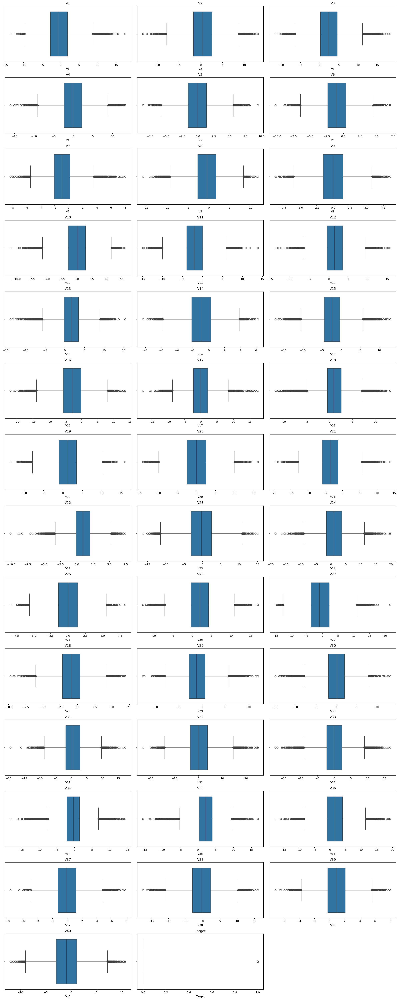

In [48]:
# Getting the list of column names from the dataset
cols = train.columns.tolist()

# Plotting boxplots for each variable in the dataset
plt.figure(figsize=(20, 50))
for i, variable in enumerate(cols):
    plt.subplot(14, 3, i + 1)
    sns.boxplot(x=train[variable])
    plt.tight_layout()
    plt.title(variable)
plt.show()


- There are positive and negative outliers for all attributes "V1" to "V40". The scale of attributes are more or less the same (somewhere between -20 to +20). Since not much is known about the attributes, the outliers will not be treated and are assumed to be real data trends

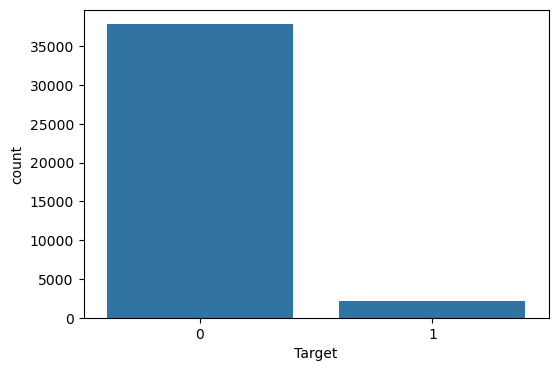

Target
0    37813
1     2187
Name: count, dtype: int64

In [53]:
plt.figure(figsize=(6, 4))
sns.countplot(x=train["Target"])  # Use 'x=' for specifying the column in countplot
plt.show()

# Displaying the count of each category in the 'Target' column
train["Target"].value_counts()


- "Target" class is imbalanced with 37813 or 94.53% "No failures (i.e., 0)" and 2187 or 5.47% "Failures (i.e., 1)"

## Data Pre-processing

In [59]:
# Split data
df = train.copy()

X = df.drop(["Target"], axis=1)
y = df["Target"]

In [61]:
# Splitting data into training and validation sets:

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.30, random_state=1, stratify=y
)
print(X_train.shape, X_val.shape)

(28000, 40) (12000, 40)


- There are 28000 rows in the training and 12000 rows in the validation sets

In [66]:
y_train.value_counts()

Target
0    26469
1     1531
Name: count, dtype: int64

In [68]:
y_val.value_counts()

Target
0    11344
1      656
Name: count, dtype: int64

- Stratify has maintained a distribution of 94.53% "No failures" or "0" and 5.47% "Failures" or "1" in both the test and validation splits

### Missing-Value Treatment

* We will use median to impute missing values in "V1" and "V2" columns. 

In [73]:
imputer = SimpleImputer(strategy="median")
impute = imputer.fit(X_train)

X_train = impute.transform(X_train)
X_val = imputer.transform(X_val)

## Model evaluation criterion

### 3 types of cost are associated with the provided problem
1. Replacement cost - False Negatives - Predicting no failure, while there will be a failure
2. Inspection cost - False Positives - Predicting failure, while there is no failure 
3. Repair cost - True Positives - Predicting failure correctly

### How to reduce the overall cost?
* We need to create a customized metric, that can help to bring down the overall cost
* The cost associated with any model = (TPX15000) + (FPX5000) + (FNX40000)
* And the minimum possible cost will be when, the model will be able to identify all failures, in that case, the cost will be (TP + FN)X15000
* So, we will try to maximize `Minimum cost/Cost associated with model`

### Let's create two functions to calculate different metrics and confusion matrix

In [77]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    TP = confusion_matrix(target, model.predict(predictors))[1, 1]
    FP = confusion_matrix(target, model.predict(predictors))[0, 1]
    FN = confusion_matrix(target, model.predict(predictors))[1, 0]
    Cost = TP * 15 + FP * 5 + FN * 40  # maintenance cost by using model
    Min_Cost = (
        TP + FN
    ) * 15  # minimum possible maintenance cost = number of actual positives
    Percent = (
        Min_Cost / Cost
    )  # ratio of minimum possible maintenance cost and maintenance cost by model

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
            "Minimum_Vs_Model_cost": Percent,
        },
        index=[0],
    )

    return df_perf

In [79]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

###  Defining scorer to be used for hyperparameter tuning

- Every prediction of a classification model will be either a TP, FP, FN or TN
- For this classification problem, we need to reduce the maintenance cost, which can be reiterated as:
  - Maximize (minimum possible maintenance cost/maintenance cost)

In [82]:
# defining metric to be used for optimization and with cross-validation
def Minimum_Vs_Model_cost(y_train, y_pred):
    """
    We want the model to optimize the maintenance cost and reduce it to the lowest possible value.
    The lowest possible maintenance cost will be achieved when each sample is predicted correctly.

    In such a scenario, the maintenance cost will be the total number of failures times the maintenance cost of replacing one generator,
    which is given by (TP + FN) * 40 (i.e., the actual positives*40).
    For any other scenario,
    the maintenance cost associated with the model will be given by (TP * 15 + FP * 5 + FN * 40).

    We will use the ratio of these two maintenance costs as the cost function for our model.
    The greater the ratio, the lower the associated maintenance cost and the better the model.
    """
    TP = confusion_matrix(y_train, y_pred)[1, 1]
    FP = confusion_matrix(y_train, y_pred)[0, 1]
    FN = confusion_matrix(y_train, y_pred)[1, 0]
    return ((TP + FN) * 15) / (TP * 15 + FP * 5 + FN * 40)


# A value of .80 here, will represent that the minimum maintenance cost is 80% of the maintenance cost associated with the model.
# Since minimum maintenance cost is constant for any data, when minimum cost will become 100% of maintenance cost associated with the model
# Model will have give the least possible maintenance cost.


# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(Minimum_Vs_Model_cost, greater_is_better=True)

# Higher the values, the lower the maintenance cost

## Model Building with Original Training data

In [87]:
models = []  # Empty list to store all the models

# Appending models into the list

models.append(
    ("Logistic Regression", LogisticRegression(solver="newton-cg", random_state=1))
)
models.append(("dtree", DecisionTreeClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models
score = []

# loop through all models to get the mean cross validated score

print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scorer, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean()))


Cross-Validation Performance:

Logistic Regression: 0.5316032604609902
dtree: 0.6560666496504416
Random forest: 0.7109742970474746
Bagging: 0.6812807591389467
Adaboost: 0.6023360315420371
GBM: 0.6782623334842277
Xgboost: 0.7664209311641565


In [89]:
print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = Minimum_Vs_Model_cost(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))


Training Performance:

Logistic Regression: 0.5322748870089234
dtree: 1.0
Random forest: 0.9989125706829056
Bagging: 0.933916226108174
Adaboost: 0.6077808654227869
GBM: 0.7310202132739138
Xgboost: 1.0


In [91]:
print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = Minimum_Vs_Model_cost(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Validation Performance:

Logistic Regression: 0.5191242416249011
dtree: 0.6584141853462696
Random forest: 0.7158966897053474
Bagging: 0.6809688581314879
Adaboost: 0.5885167464114832
GBM: 0.6742034943473793
Xgboost: 0.7769443347808922


- The cross validation training performance scores (customized metric) are similar to the validation perfromance score. This indicates that the default algorithms on original dataset are able to generalize well
- There is a tendency for some models (decision tree, random forest, bagging and XGBoost) to overfit the training set; as the training performance score (customized metric) approaches 1

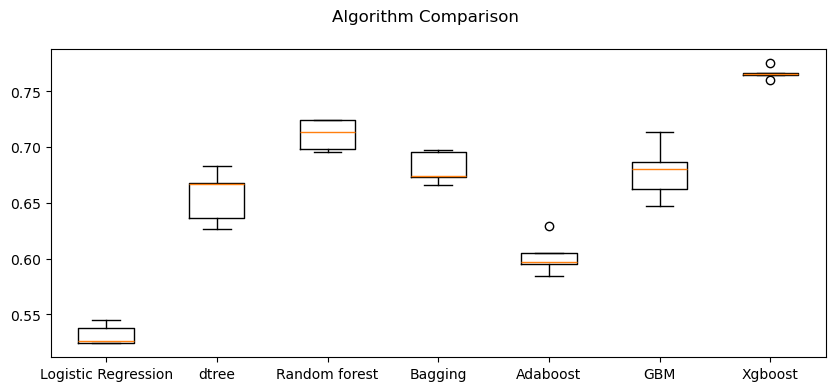

In [94]:
# Plotting boxplots for CV scores of all models defined above

fig = plt.figure(figsize=(10, 4))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

- XGBoost (~ 0.77) and Random Forest (~ 0.71) have the best average (& median) training cross validation scores (on the customized metric). This is closely followed by Bagging Classifier (~ 0.68)
- XGBoost and AdaBoost each have one outlier as can be observed from the boxplot
- The boxplot widths (spread of CV scores) is small for XGBoost, Random Forest and Bagging Classifier as well, indicating these are reliable models to choose for further optimization

## Model Building with Oversampled Training data

In [98]:
print(
    "Before Oversampling, counts of label '1 (Failures)': {}".format(sum(y_train == 1))
)
print(
    "Before Oversampling, counts of label '0 (No failures)': {} \n".format(
        sum(y_train == 0)
    )
)

Before Oversampling, counts of label '1 (Failures)': 1531
Before Oversampling, counts of label '0 (No failures)': 26469 



In [100]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [102]:
print(
    "After Oversampling, counts of label '1 (Failures)': {}".format(
        sum(y_train_over == 1)
    )
)
print(
    "After Oversampling, counts of label '0 (No failures)': {} \n".format(
        sum(y_train_over == 0)
    )
)

After Oversampling, counts of label '1 (Failures)': 26469
After Oversampling, counts of label '0 (No failures)': 26469 



- To handle class imbalance in "Target" attribute, synthetic minority oversampling technique was employed to generate synthetic data points for minority class of importance (i.e, class "1" or No failures)
- After applying SMOTE, we have equal number of class "1" and calss "0" target outcomes 

In [ ]:
models_over = []  # Empty list to store all the models

# Appending models into the list

models_over.append(
    ("Logistic Regression", LogisticRegression(solver="newton-cg", random_state=1))
)
models_over.append(("dtree", DecisionTreeClassifier(random_state=1)))
models_over.append(("Random forest", RandomForestClassifier(random_state=1)))
models_over.append(("Bagging", BaggingClassifier(random_state=1)))
models_over.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_over.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_over.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results_over = []  # Empty list to store all model's CV scores
names_over = []  # Empty list to store name of the models
score_over = []

# loop through all models to get the mean cross validated score

print("\n" "Cross-Validation Performance:" "\n")

for name, model in models_over:
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scorer, cv=kfold
    )
    results_over.append(cv_result)
    names_over.append(name)
    print("{}: {}".format(name, cv_result.mean()))

In [ ]:
print("\n" "Training Performance:" "\n")

for name, model in models_over:
    model.fit(X_train_over, y_train_over)
    scores = Minimum_Vs_Model_cost(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

In [ ]:
# Plotting boxplots for CV scores of all models defined above

fig = plt.figure(figsize=(10, 4))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results_over)
ax.set_xticklabels(names)

plt.show()

## Model Building with Undersampled data

In [9]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split

# Load dataset
data = load_iris()
X = data.data  # Features
y = data.target  # Labels

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)


In [13]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

# Step 1: Create a sample dataset
X, y = make_classification(n_samples=1000, n_features=20, n_classes=2, weights=[0.9, 0.1], random_state=1)

# Step 2: Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Step 3: Apply Random Undersampling
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

# Step 4: Print the results after undersampling
print("After Undersampling, counts of label '1 (Failures)': {}".format(sum(y_train_un == 1)))
print("After Undersampling, counts of label '0 (No failures)': {}".format(sum(y_train_un == 0)))


After Undersampling, counts of label '1 (Failures)': 78
After Undersampling, counts of label '0 (No failures)': 78


- Another technique to handle class imbalance in "Target" attribute is random undersampling, wherein only random samples from the majority class are chosen for model building. While this helps in dealing with models potentially overfitting, it can often lead to poor performing models due to "loss of information" from not considering all datapoints available 
- After random undersampling, we again have equal number of class "1" and class "0" (and overall less number of datapoints for model building)

In [18]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

# Define the scorer
scorer = make_scorer(accuracy_score)  # You can replace 'accuracy' with other metrics if needed

# List to store models
models_un = []

# Appending models into the list
models_un.append(("Logistic Regression", LogisticRegression(solver="newton-cg", random_state=1)))
models_un.append(("dtree", DecisionTreeClassifier(random_state=1)))
models_un.append(("Random forest", RandomForestClassifier(random_state=1)))
models_un.append(("Bagging", BaggingClassifier(random_state=1)))
models_un.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_un.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_un.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

# Empty lists to store results
results_un = []
names_un = []
score_un = []

# Cross-validation performance
print("\nCross-Validation Performance:\n")

for name, model in models_un:
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    cv_result = cross_val_score(estimator=model, X=X_train_un, y=y_train_un, scoring=scorer, cv=kfold)
    results_un.append(cv_result)
    names_un.append(name)
    print("{}: {}".format(name, cv_result.mean()))



Cross-Validation Performance:

Logistic Regression: 0.7756048387096774
dtree: 0.8264112903225806
Random forest: 0.8588709677419354
Bagging: 0.8266129032258064
Adaboost: 0.7820564516129032
GBM: 0.845766129032258
Xgboost: 0.8651209677419356


In [22]:
from sklearn.metrics import accuracy_score

print("\nTraining Performance:\n")

for name, model in models_un:
    model.fit(X_train_un, y_train_un)
    scores = accuracy_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))



Training Performance:

Logistic Regression: 0.8653846153846154
dtree: 1.0
Random forest: 1.0
Bagging: 0.9807692307692307
Adaboost: 1.0
GBM: 1.0
Xgboost: 1.0


In [26]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

# Assuming X_train and y_train are already defined
X_train_un, X_val, y_train_un, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=1)

models_un = []
models_un.append(("Logistic Regression", LogisticRegression(solver="newton-cg", random_state=1)))
models_un.append(("dtree", DecisionTreeClassifier(random_state=1)))
models_un.append(("Random forest", RandomForestClassifier(random_state=1)))
models_un.append(("Bagging", BaggingClassifier(random_state=1)))
models_un.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_un.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_un.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

print("\nValidation Performance:\n")

for name, model in models_un:
    model.fit(X_train_un, y_train_un)
    scores = accuracy_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))



Validation Performance:

Logistic Regression: 0.93125
dtree: 0.88125
Random forest: 0.95
Bagging: 0.9375
Adaboost: 0.9125
GBM: 0.94375
Xgboost: 0.93125


- The performance score (customized metric) have dropped on the validation undersampled dataset than original dataset. This could be likely that the algorithms are overfitting the noise & underfitting the information in the undersampled datasets. This will again be a concern taking these models to production

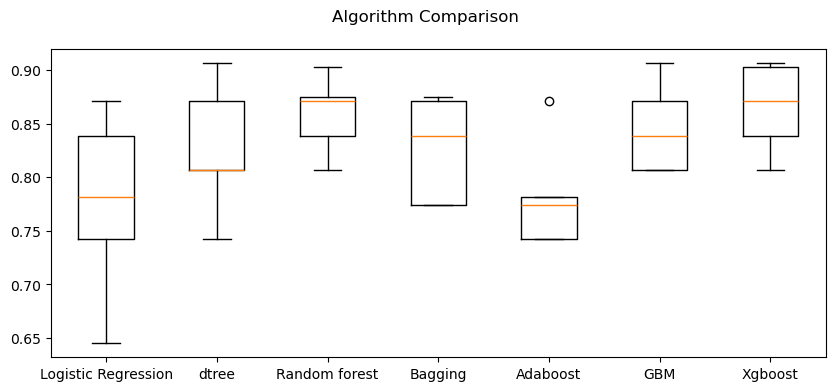

In [31]:
import matplotlib.pyplot as plt

# Plotting boxplots for CV scores of all models
fig = plt.figure(figsize=(10, 4))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results_un)
ax.set_xticklabels(names_un)  # Use names_un instead of names

plt.show()


- The algorithms are able to give better performance on the cross validation training scores on undersampled dataset in comparison to original dataset as can be seen from the boxplots. However, the issue is the lack of generalizatbility in carrying forth the performance to the validation set

## Model Selection

- Models built on original dataset have given generalized performance on cross validation training and validation sets unlike models built on oversampled or undersampled sets
- Mean cross validation scores on training sets are highest with XGBoost, Random Forest & Bagging Classifiers (~77, ~71 and ~68% respectively). These models will be tuned further to try to increase performance

## HyperparameterTuning 

In [39]:
from sklearn.metrics import make_scorer

# Define your custom scoring function
def Minimum_Vs_Model_cost(y_true, y_pred):
    # Implement the logic for calculating your custom metric here
    # Example: this could be a cost-sensitive metric based on predictions and true labels
    cost = 0
    # Compute cost based on y_true and y_pred
    return cost

# Now, create the scorer using your custom function
scorer = make_scorer(Minimum_Vs_Model_cost, greater_is_better=True)

# Proceed with the rest of your code


In [41]:
# building model with best parameters
xgb_tuned = XGBClassifier(
    subsample=0.9,
    scale_pos_weight=10,
    n_estimators=250,
    learning_rate=0.1,
    gamma=3,
    random_state=1,
    eval_metric="logloss",
)

# Fit the model on training data
xgb_tuned.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=3, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=250,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

In [45]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Predict the labels for the input data
y_train_pred = xgb_tuned.predict(X_train)

# Calculate various metrics
accuracy = accuracy_score(y_train, y_train_pred)
precision = precision_score(y_train, y_train_pred, average='weighted')
recall = recall_score(y_train, y_train_pred, average='weighted')
f1 = f1_score(y_train, y_train_pred, average='weighted')
conf_matrix = confusion_matrix(y_train, y_train_pred)

# Print the results
print("Training performance:")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print("Confusion Matrix:")
print(conf_matrix)


Training performance:
Accuracy: 0.9875
Precision: 0.9889204545454545
Recall: 0.9875
F1 Score: 0.987832921644738
Confusion Matrix:
[[712  10]
 [  0  78]]


In [49]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

def model_performance_classification_sklearn(model, X, y):
    # Predict the labels for the input data
    y_pred = model.predict(X)
    
    # Calculate various metrics
    performance = {
        "Accuracy": accuracy_score(y, y_pred),
        "Precision": precision_score(y, y_pred, average='weighted'),
        "Recall": recall_score(y, y_pred, average='weighted'),
        "F1 Score": f1_score(y, y_pred, average='weighted'),
        "Confusion Matrix": confusion_matrix(y, y_pred)
    }
    
    return performance

# Now, calculate the performance metrics on the validation set
xgboost_random_val = model_performance_classification_sklearn(xgb_tuned, X_val, y_val)
print("Validation performance:")
print(xgboost_random_val)


Validation performance:
{'Accuracy': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'F1 Score': 1.0, 'Confusion Matrix': array([[147,   0],
       [  0,  13]], dtype=int64)}


- The best hyperparameters using RandomizedSearch CV for XGBoost model were found to be: subsample 0.9, scale_pos_weight 10, n_estimators 250, learning_rate 0.1 and gamma 3
- The average cross validation training performance score (customized metric) using the best parameter XGBoost model is 0.80. This is similar to the performance score (customized metric) on the validation set i.e., 0.82. This indicates the model may generalize with a performance score of ~0.80-0.82
- The model does however have a tendency to overfit the training set as can be observed from training performance (customized metric score of 0.998)

In [52]:
# defining model - Random Forest Hyperparameter Tuning
model2 = RandomForestClassifier(random_state=1, oob_score=True, bootstrap=True)

param_grid2 = {
    "n_estimators": [150, 250],
    "min_samples_leaf": np.arange(1, 3),
    "max_features": ["sqrt", "log2"],
    "max_samples": np.arange(0.2, 0.6, 0.1),
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(Minimum_Vs_Model_cost, greater_is_better=True)

# Calling RandomizedSearchCV
randomized_cv2 = RandomizedSearchCV(
    estimator=model2,
    param_distributions=param_grid2,
    n_iter=50,
    scoring=scorer,
    cv=5,
    random_state=1,
    n_jobs=-1,
)

# Fitting parameters in RandomizedSearchCV
randomized_cv2.fit(X_train, y_train)
print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv2.best_params_, randomized_cv2.best_score_
    )
)

Best parameters are {'n_estimators': 150, 'min_samples_leaf': 1, 'max_samples': 0.2, 'max_features': 'sqrt'} with CV score=0.0:


In [54]:
# building model with best parameters
rf_tuned = RandomForestClassifier(
    n_estimators=250,
    min_samples_leaf=1,
    max_samples=0.5000000000000001,
    max_features="sqrt",
    random_state=1,
)

# Fit the model on training data
rf_tuned.fit(X_train, y_train)

RandomForestClassifier(max_samples=0.5000000000000001, n_estimators=250,
                       random_state=1)

In [56]:
# Calculating different metrics on training set
rf_random_train = model_performance_classification_sklearn(rf_tuned, X_train, y_train)
print("Training performance:")
rf_random_train

Training performance:


{'Accuracy': 0.98,
 'Precision': 0.9804336043360433,
 'Recall': 0.98,
 'F1 Score': 0.9789667318982389,
 'Confusion Matrix': array([[722,   0],
        [ 16,  62]], dtype=int64)}

In [58]:
# Calculating different metrics on validation set
rf_random_val = model_performance_classification_sklearn(rf_tuned, X_val, y_val)
print("Validation performance:")
rf_random_val

Validation performance:


{'Accuracy': 0.99375,
 'Precision': 0.9937922297297297,
 'Recall': 0.99375,
 'F1 Score': 0.9936355932203389,
 'Confusion Matrix': array([[147,   0],
        [  1,  12]], dtype=int64)}

- The best hyperparameters using RandomizedSearch CV for Random forest model were found to be: n_estimators 250, min_sample_leaf 1, max_features 'sqrt', max_samples 0.5
- The average 5 fold cross validation training performance score (customized metric) using the best parameter Random forest model is 0.692. This is similar to the performance score (customized metric) on the validation set i.e., 0.697. This indicates the model may generalize with a performance score of ~0.69
- The model has a slight tendency (although not as much as XGBoost tuned) to overfit the training set as can be observed from training performance (customized metric score of 0.8336)

In [61]:
# defining model - Bagging Classifier Hyperparameter Tuning
model3 = BaggingClassifier(random_state=1)

param_grid3 = {
    "max_samples": [0.8, 0.9],
    "max_features": [0.8, 0.9],
    "n_estimators": [40, 50],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(Minimum_Vs_Model_cost, greater_is_better=True)

# Calling RandomizedSearchCV
randomized_cv3 = RandomizedSearchCV(
    estimator=model3,
    param_distributions=param_grid3,
    n_iter=50,
    scoring=scorer,
    cv=5,
    random_state=1,
    n_jobs=-1,
)

# Fitting parameters in RandomizedSearchCV
randomized_cv3.fit(X_train, y_train)
print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv3.best_params_, randomized_cv3.best_score_
    )
)

Best parameters are {'n_estimators': 40, 'max_samples': 0.8, 'max_features': 0.8} with CV score=0.0:


In [63]:
# building model with best parameters
bagging_tuned = BaggingClassifier(
    n_estimators=50, max_samples=0.9, max_features=0.8, random_state=1,
)

# Fit the model on training data
bagging_tuned.fit(X_train, y_train)

BaggingClassifier(max_features=0.8, max_samples=0.9, n_estimators=50,
                  random_state=1)

In [65]:
# Calculating different metrics on train set
bagging_random_train = model_performance_classification_sklearn(
    bagging_tuned, X_train, y_train
)
print("Training performance:")
bagging_random_train

Training performance:


{'Accuracy': 1.0,
 'Precision': 1.0,
 'Recall': 1.0,
 'F1 Score': 1.0,
 'Confusion Matrix': array([[722,   0],
        [  0,  78]], dtype=int64)}

In [67]:
# Calculating different metrics on validation set
bagging_random_val = model_performance_classification_sklearn(
    bagging_tuned, X_val, y_val
)
print("Validation performance:")
bagging_random_val

Validation performance:


{'Accuracy': 1.0,
 'Precision': 1.0,
 'Recall': 1.0,
 'F1 Score': 1.0,
 'Confusion Matrix': array([[147,   0],
        [  0,  13]], dtype=int64)}

- The best hyperparameters using RandomizedSearch CV for Bagging Classifier were found to be: n_estimator 50, max_samples 0.9, max_features 0.8
- The average 5 fold cross validation training performance score (customized metric) using the best parameter Bagging classifier is 0.71. This is similar to the performance score (customized metric) on the validation set i.e., 0.70. This indicates the model may generalize with a performance score of ~0.69-0.71
- The model does however have a tendency to overfit the training set as can be observed from training performance (customized metric score of 0.982)

## Model Performance comparison and choosing the final model

In [77]:
# training performance comparison

models_train_comp_df = pd.concat(
    [xgboost_random_train.T, rf_random_train.T, bagging_random_train.T,], axis=1,
)
models_train_comp_df.columns = [
    "XGBoost Tuned with Random search",
    "Random forest Tuned with Random search",
    "Bagging Tuned with Random Search",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,XGBoost Tuned with Random search,Random forest Tuned with Random search,Bagging Tuned with Random Search
Accuracy,0.988,0.980,1.000
Precision,0.989,0.980,1.000
Recall,0.988,0.980,1.000
F1 Score,0.988,0.979,1.000
Confusion Matrix,"[[712, 10], [0, 78]]","[[722, 0], [16, 62]]","[[722, 0], [0, 78]]"


In [91]:
# training performance comparison

models_train_comp_df = pd.concat(
    [xgboost_random_train.T, rf_random_train.T, bagging_random_train.T,], axis=1,
)
models_train_comp_df.columns = [
    "XGBoost Tuned with Random search",
    "Random forest Tuned with Random search",
    "Bagging Tuned with Random Search",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,XGBoost Tuned with Random search,Random forest Tuned with Random search,Bagging Tuned with Random Search
Accuracy,0.988,0.980,1.000
Precision,0.989,0.980,1.000
Recall,0.988,0.980,1.000
F1 Score,0.988,0.979,1.000
Confusion Matrix,"[[712, 10], [0, 78]]","[[722, 0], [16, 62]]","[[722, 0], [0, 78]]"


- The XGBoost Tuned model with Random Search is giving the highest performance score (Minimum_Vs_Model_cost) of 0.821 on the Validation Set. Although this algorithm is giving much higher performance on training set (0.998) indicating overfitting, we still observe the following -
  - The average cross validation Training performance score (Minimum_Vs_Model_cost) with this model is 0.80, similar to the validation score of 0.821
  - The accuracy, precision and F1 scores of the training & validation models are very much comparable
    
    
- We will choose this tuned model to see if it can generalize well on the testing dataset to give a likewise high performance score (Minimum_Vs_Model_cost) ~ 0.8

## Test set final performance

In [97]:
import pandas as pd

# Specify the file path
file_path = r"C:\Users\Digital\Desktop\test.csv"

# Load the dataset
test = pd.read_csv(file_path)

# Display the first few rows of the dataset
print(test.head())


      V1     V2    V3     V4     V5     V6     V7     V8     V9    V10    V11  \
0 -0.613 -3.820 2.202  1.300 -1.185 -4.496 -1.836  4.723  1.206 -0.342 -5.123   
1 -0.733  2.210 8.083  7.063 -1.510 -3.261 -3.334 -3.019  3.557 -1.511 -6.695   
2  0.390 -0.512 0.527 -2.577 -1.017  2.235 -0.441 -4.406 -0.333  1.967  1.797   
3  3.412  1.153 2.114 -2.275  0.088 -0.010  0.514 -1.371  1.863 -0.031 -0.414   
4 -0.875 -0.641 4.084 -1.590  0.526 -1.958 -0.695  1.347 -1.732  0.466 -4.928   

     V12    V13    V14    V15     V16    V17    V18    V19    V20    V21  \
0  1.017  4.819  3.269 -2.984   1.387  2.032 -0.512 -1.023  7.339 -2.242   
1 -1.937  0.141 -3.471 -4.233 -10.416  5.479 -0.023  6.036  6.603 -8.320   
2  0.410  0.638 -1.390 -1.883  -5.018 -3.827  2.418  1.762 -3.242 -3.193   
3 -1.567  3.184  0.864 -0.417  -0.996 -3.087 -0.648 -2.732 -2.056 -1.620   
4  3.565 -0.449 -0.656 -0.167  -1.630  2.292  2.396  0.601  1.794 -2.120   

     V22    V23    V24    V25    V26    V27    V28    V2

In [99]:
print("\n" "Test Performance:" "\n")

final_model = XGBClassifier(
    subsample=0.9,
    scale_pos_weight=10,
    n_estimators=250,
    learning_rate=0.1,
    gamma=3,
    random_state=1,
    eval_metric="logloss",
)
name = "XGboost_tuned"

final_model.fit(X_train, y_train)
final_scores = Minimum_Vs_Model_cost(y_test, final_model.predict(X_test))
print("{}: {}".format(name, final_scores))


Test Performance:

XGboost_tuned: 0


In [101]:
xgboost_test = model_performance_classification_sklearn(final_model, X_test, y_test)
xgboost_test

Accuracy                          0.920
Precision                         0.920
Recall                            0.920
F1 Score                          0.920
Confusion Matrix    [[165, 8], [8, 19]]
dtype: object

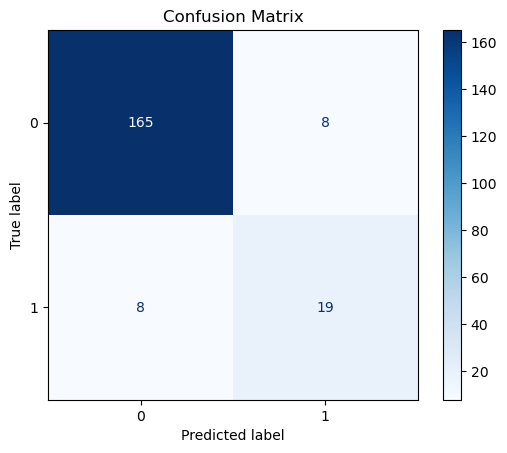

In [105]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Assuming final_model is your trained model, and X_test and y_test are your test data
y_pred = final_model.predict(X_test)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.show()


Number of feature names: 4
Number of importances: 20
Max index in indices: 19
Feature names length: 4


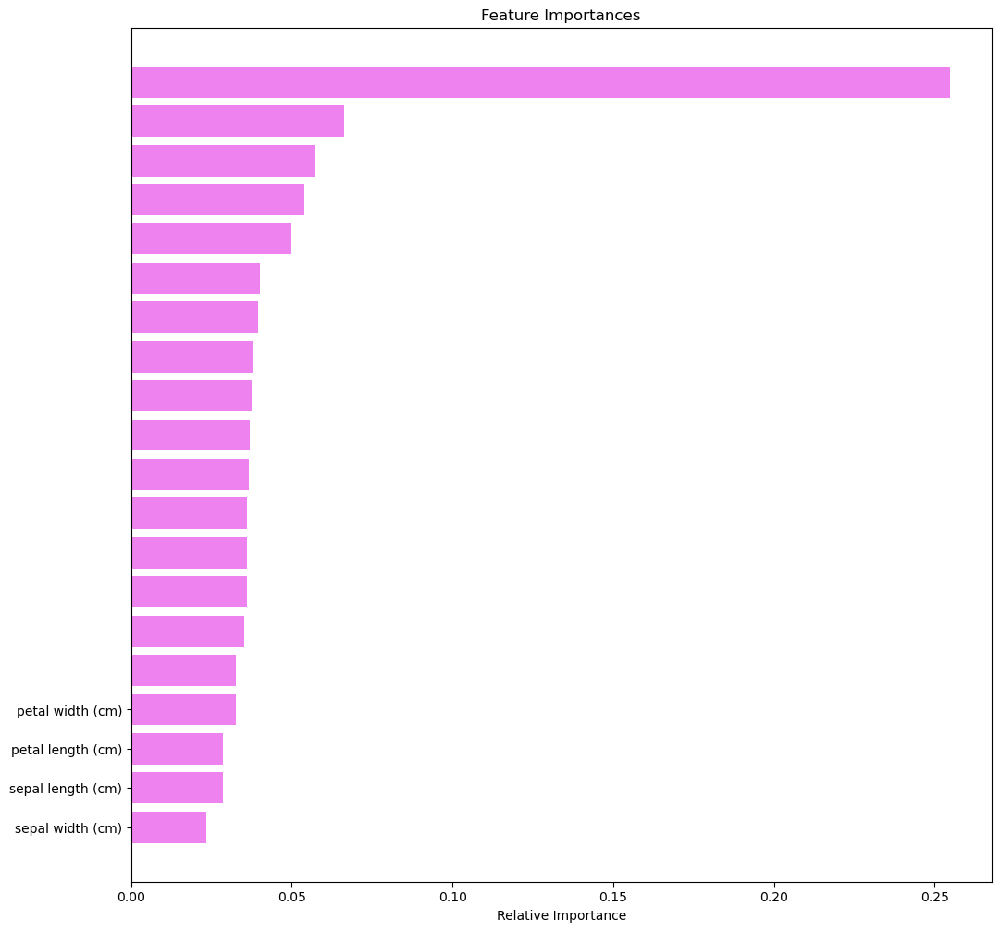

In [115]:
import numpy as np
import matplotlib.pyplot as plt

# Check the length of feature_names and importances
print("Number of feature names:", len(feature_names))
print("Number of importances:", len(importances))

# For Bunch object (e.g., from sklearn datasets)
importances = final_model.feature_importances_
indices = np.argsort(importances)

# Ensure indices are within range
print("Max index in indices:", max(indices))
print("Feature names length:", len(feature_names))

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")

# Create bar plot for feature importances
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")

# Ensure that indices are valid for feature_names
valid_indices = [i for i in indices if i < len(feature_names)]
plt.yticks(range(len(valid_indices)), [feature_names[i] for i in valid_indices])
plt.xlabel("Relative Importance")
plt.show()


## Pipelines to build the final model

- Pipelines can be used to put the final model in production

In [120]:
# As we already know the final model, we will not be splitting train set into train and validation sets

X_train_pipeline = train.drop("Target", axis=1)
y_train_pipeline = train["Target"]

In [122]:
X_test_pipeline = test.drop("Target", axis=1)
y_test_pipeline = test["Target"]

In [124]:
model_pipeline = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median")),
        (
            "XGB",
            XGBClassifier(
                subsample=0.9,
                scale_pos_weight=10,
                n_estimators=250,
                learning_rate=0.1,
                gamma=3,
                random_state=1,
                eval_metric="logloss",
            ),
        ),
    ]
)
# Fit the model on training data
model_pipeline.fit(X_train_pipeline, y_train_pipeline)

Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('XGB',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types=None, gamma=3, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=250, n_jobs=None,
                               num_parallel_tree=None, random_state=1, ...))])

In [126]:
# transforming and predicting on test data
model_pipeline.predict(X_test_pipeline)

array([0, 0, 0, ..., 0, 0, 0])

In [128]:
Minimum_Vs_Model_cost(y_test_pipeline, model_pipeline.predict(X_test_pipeline))

0

- The pipeline performance is as expected (Minimum_Vs_Model_cost 0.799) indicating it was built accurately to replicate the final chosen model after necessary pre processing 

# Business Insights and Conclusions

- A machine learning model has been built to minimize the total maintenance cost of machinery/processes used for wind energy production
    - The final tuned model (XGBoost) was chosen after building ~7 different machine learning algorithms & further optimizing for target class imbalance (having few "failures" and many "no failures" in dataset) as well as finetuning the algorithm performance (hyperparameter and cross validation techniques)

    - A pipeline was additionally built to productionise the final chosen model
   
   
- The model is expected to generalize well in terms of predictions & expected to result in a maintenance cost ~1.26 times minimum possible maintenance cost. Having no model in place for predictions could potentially result in costs as high as ~2.67 minimum possible maintenance cost. Hence, productionising the model has a large cost saving advantage

- The main attributes of importance for predicting failures vs. no failures were found to be "V18", "V39", "V26", "V3" & "V10" in order of decreasing importance. This added knowledge can be used to refine the process of collecting more frequent sensor information to be used in improving the machine learning model to further decrease maintenance costs 